# ¿Por qué estudiar la violencia intrafamiliar en Colombia?

La violencia intrafamiliar es una problemática muy común en Colombia y en Latinoamérica. Los datos que se tienen sobre esta situación es muy posible que sean sólo una pequeña porción de la realidad dado que las víctimas no siempre quieren denunciar estos actos.  Es una situación que generalmente se presenta en el ámbito privado por lo que la intervención que puede hacer el Estado parece ser limitada pero no tiene que ser así. 

# Vamos a utilizar una base de datos de Kaggle y se va a extraer con su API

Instalar la librería de kaggle

In [1]:
pip install kaggle

Note: you may need to restart the kernel to use updated packages.


In [2]:
import kaggle
import pandas as pd

In [4]:
from kaggle.api.kaggle_api_extended import KaggleApi

In [5]:
api = KaggleApi()
api.authenticate()

In [6]:
api.dataset_download_file('oscardavidperilla/domestic-violence-in-colombia',
                         file_name='Reporte_Delito_Violencia_Intrafamiliar_Polic_a_Nacional.csv')

False

In [7]:
from zipfile import ZipFile

In [8]:
zf = ZipFile('Reporte_Delito_Violencia_Intrafamiliar_Polic_a_Nacional.csv.zip')

zf.extractall() 
zf.close()

In [9]:
data=pd.read_csv('Reporte_Delito_Violencia_Intrafamiliar_Polic_a_Nacional.csv')

C:\Users\Manuela\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [10]:
data

,DEPARTAMENTO,MUNICIPIO,CODIGO DANE,ARMAS MEDIOS,FECHA HECHO,GENERO,GRUPO ETARIO,CANTIDAD
0,ATLÁNTICO,BARRANQUILLA (CT),8001000,ARMA BLANCA / CORTOPUNZANTE,1/01/2010,MASCULINO,ADULTOS,1
1,BOYACÁ,DUITAMA,15238000,ARMA BLANCA / CORTOPUNZANTE,1/01/2010,FEMENINO,ADULTOS,1
2,CAQUETÁ,PUERTO RICO,18592000,ARMA BLANCA / CORTOPUNZANTE,1/01/2010,MASCULINO,ADULTOS,1
3,CASANARE,MANÍ,85139000,ARMA BLANCA / CORTOPUNZANTE,1/01/2010,FEMENINO,ADULTOS,1
4,CUNDINAMARCA,BOGOTÁ D.C. (CT),11001000,ARMA BLANCA / CORTOPUNZANTE,1/01/2010,FEMENINO,ADULTOS,1
...,...,...,...,...,...,...,...,...
476965,VICHADA,SANTA ROSALÍA,99624000,SIN EMPLEO DE ARMAS,44250,FEMENINO,MENORES,1
476966,VICHADA,SANTA ROSALÍA,99624000,SIN EMPLEO DE ARMAS,44262,FEMENINO,ADULTOS,1
476967,VICHADA,SANTA ROSALÍA,99624000,SIN EMPLEO DE ARMAS,44300,FEMENINO,ADULTOS,1
476968,CUNDINAMARCA,TAUSA,25793000,NaN,44294,FEMENINO,ADULTOS,1


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pandas as pd

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 476970 entries, 0 to 476969
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   DEPARTAMENTO  476970 non-null  object
 1   MUNICIPIO     476970 non-null  object
 2   CODIGO DANE   476970 non-null  object
 3   ARMAS MEDIOS  476968 non-null  object
 4   FECHA HECHO   476970 non-null  object
 5   GENERO        476967 non-null  object
 6   GRUPO ETARIO  475355 non-null  object
 7   CANTIDAD      476970 non-null  int64 
dtypes: int64(1), object(7)
memory usage: 29.1+ MB


In [13]:
data['FECHA HECHO'] =  pd.to_datetime(data['FECHA HECHO'], format='%d/%m/%Y', errors='coerce')

In [14]:
datos=data.dropna()

In [15]:
datos
#cuenta con 475347 observaciones 

,DEPARTAMENTO,MUNICIPIO,CODIGO DANE,ARMAS MEDIOS,FECHA HECHO,GENERO,GRUPO ETARIO,CANTIDAD
0,ATLÁNTICO,BARRANQUILLA (CT),8001000,ARMA BLANCA / CORTOPUNZANTE,2010-01-01,MASCULINO,ADULTOS,1
1,BOYACÁ,DUITAMA,15238000,ARMA BLANCA / CORTOPUNZANTE,2010-01-01,FEMENINO,ADULTOS,1
2,CAQUETÁ,PUERTO RICO,18592000,ARMA BLANCA / CORTOPUNZANTE,2010-01-01,MASCULINO,ADULTOS,1
3,CASANARE,MANÍ,85139000,ARMA BLANCA / CORTOPUNZANTE,2010-01-01,FEMENINO,ADULTOS,1
4,CUNDINAMARCA,BOGOTÁ D.C. (CT),11001000,ARMA BLANCA / CORTOPUNZANTE,2010-01-01,FEMENINO,ADULTOS,1
...,...,...,...,...,...,...,...,...
476957,VICHADA,PUERTO CARREÑO (CT),99001000,SIN EMPLEO DE ARMAS,2021-01-05,FEMENINO,ADULTOS,1
476958,VICHADA,PUERTO CARREÑO (CT),99001000,SIN EMPLEO DE ARMAS,2021-01-14,FEMENINO,ADULTOS,1
476959,VICHADA,PUERTO CARREÑO (CT),99001000,SIN EMPLEO DE ARMAS,2021-03-26,FEMENINO,ADULTOS,1
476960,VICHADA,PUERTO CARREÑO (CT),99001000,SIN EMPLEO DE ARMAS,2021-03-27,FEMENINO,ADULTOS,1


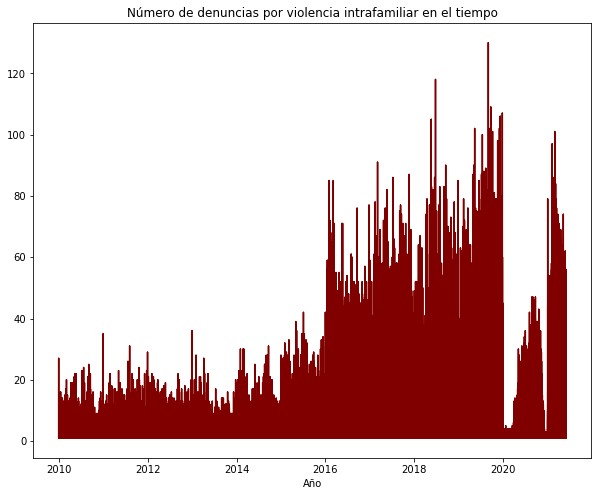

In [255]:
plt.figure(figsize=(10, 8))
fecha=datos['FECHA HECHO']
cantidad=datos['CANTIDAD']
plt.plot( fecha , cantidad , color='maroon')
plt.xlabel('Año')
plt.title('Número de denuncias por violencia intrafamiliar en el tiempo')
plt.savefig("Numero de denuncias.png")

# Historia
Como se puede evidenciar, se tienen los datos desde el 2010 hasta mayo del 2021 de las denuncias por violencia intrafamiliar en Colombia. Parece que entre el 2010, hasta el 2016 se mantuvieron en un nivel relativamente igual las denuncias, lo que no quiere decir que la violencia dentro de las familias fuera menor. Se puede pensar que el gran aumento que se presenta del 2015 al 2016 en el número de denuncias puede ser el efecto de campañas de sensibilización o tal vez una percibida mejora en el apoyo que tienen las víctimas de este tipo de violencia en el país. En el 2013 se lanzó la línea 155 de la Consejería Presidencial para la Equidad de la Mujer, canal telefónico de marcación rápida para orientar a las víctimas de violencias de género en Colombia sobre las rutas de atención. Al final del 2016, el ICBF lanza la línea 141 para denunciar maltrato, orientar y agilizar la ruta de atención cuando existe violencia contra niños, niñas y adolescentes.

In [17]:
departamentos = datos.groupby("DEPARTAMENTO")

In [18]:
violenciadep=departamentos["CANTIDAD"].count()
violenciadep

DEPARTAMENTO
AMAZONAS               1407
ANTIOQUIA             57181
ARAUCA                 3847
ATLÁNTICO             17449
BOLÍVAR               15889
BOYACÁ                26913
CALDAS                 8707
CAQUETÁ                4852
CASANARE               6417
CAUCA                 13930
CESAR                  7087
CHOCÓ                  2071
CUNDINAMARCA          87376
CÓRDOBA               10800
GUAINÍA                 518
GUAJIRA                4431
GUAVIARE                886
HUILA                 16540
MAGDALENA              9679
META                  16186
NARIÑO                14344
NO REPORTA                6
NORTE DE SANTANDER    14883
PUTUMAYO               3096
QUINDÍO                4800
RISARALDA             14304
SAN ANDRÉS             1153
SANTANDER             38416
SUCRE                  9714
TOLIMA                16935
VALLE                 44740
VAUPÉS                  372
VICHADA                 418
Name: CANTIDAD, dtype: int64

In [232]:
violenciadep.to_frame()
violenciadep1=violenciadep.sort_values(ascending=False)
violenciadep1=violenciadep1.to_frame()
violenciadep1

,CANTIDAD
DEPARTAMENTO,
CUNDINAMARCA,87376
ANTIOQUIA,57181
VALLE,44740
SANTANDER,38416
BOYACÁ,26913
ATLÁNTICO,17449
TOLIMA,16935
HUILA,16540
META,16186


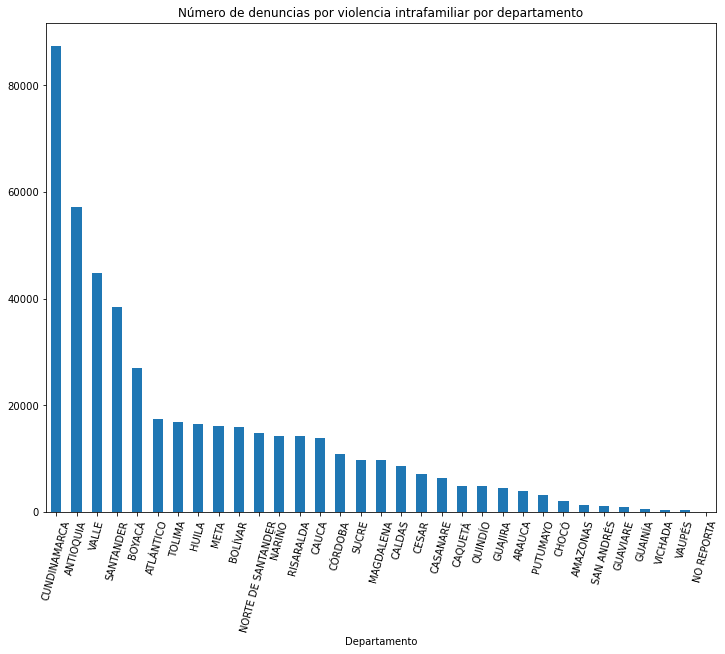

In [260]:
plt.figure(figsize=(12,9))

violenciadep.sort_values(ascending=False).plot.bar()
plt.xticks(rotation=75)
plt.xlabel("Departamento")

plt.title('Número de denuncias por violencia intrafamiliar por departamento')
plt.savefig("Numero de denuncias por departamento.png",dpi=72)
plt.show()


# Historia
Lo que se puede evidenciar en esta gráfica son las diferencias en el número de denuncias en este rango de tiempo por departamento. Lo que puede explicar esto no sólo es en parte porque son unos de los departamentos con mayor población sino que también puede pensarse que es porque son éstos los lugares donde las personas tienen más conocimiento de las rutas de atención para víctimas o solo más percepción de la presencia del Estado. Estos datos son muy útiles dado que muestra también que los lugares donde menos se denuncia este tipo de violencia en Colombia son departamentos que se encuentran más bien aislados o en la periferia. Una situación como esta muestra que deben haber más campañas de sensibilización en todos los departamentos y posiblemente una mejor articulación de las rutas de apoyo de víctimas para que accedan a casas provisionales o de refugio y tengan un entorno seguro.

In [23]:
datos.columns

Index(['DEPARTAMENTO', 'MUNICIPIO', 'CODIGO DANE', 'ARMAS MEDIOS',
       'FECHA HECHO', 'GENERO', 'GRUPO ETARIO', 'CANTIDAD'],
      dtype='object')

In [39]:
armas= datos.loc[:,'ARMAS MEDIOS'].astype('category')
armas

0         CORTOPUNZANTE
1         CORTOPUNZANTE
2         CORTOPUNZANTE
3         CORTOPUNZANTE
4         CORTOPUNZANTE
              ...      
476957        SIN_ARMAS
476958        SIN_ARMAS
476959        SIN_ARMAS
476960        SIN_ARMAS
476961        SIN_ARMAS
Name: ARMAS MEDIOS, Length: 475347, dtype: category
Categories (8, object): [-, ARMA DE FUEGO, CONTUNDENTES, CORTOPUNZANTE, ESCOPOLAMINA, NO REPORTA, NO_REPORTADO, SIN_ARMAS]

In [40]:
armas.value_counts()

CONTUNDENTES     244896
SIN_ARMAS        107246
NO_REPORTADO      71894
CORTOPUNZANTE     40703
NO REPORTA         4421
ESCOPOLAMINA       3863
ARMA DE FUEGO      2323
-                     1
Name: ARMAS MEDIOS, dtype: int64

In [122]:
armas1 = armas.replace({'SIN EMPLEO DE ARMAS':'SIN_ARMAS','ARMA BLANCA / CORTOPUNZANTE':'CORTOPUNZANTE','NO REPORTADO':'NO_REPORTADO','NO REPORTA':'NO_REPORTADO', 
                                                       'CORTOPUNZANTES':'CORTOPUNZANTE', 'CORTANTES': 'CORTOPUNZANTE', 
                                                       'PUNZANTES': 'CORTOPUNZANTE', 'ARMA DE FUEGO':'ARMA_DE_FUEGO'})

In [123]:
armas3= armas1.value_counts()
armas3

CONTUNDENTES     244896
SIN_ARMAS        107246
NO_REPORTADO      76315
CORTOPUNZANTE     40703
ESCOPOLAMINA       3863
ARMA_DE_FUEGO      2323
-                     1
Name: ARMAS MEDIOS, dtype: int64

In [124]:
armas2=armas3.to_frame()

In [179]:
armas2.reset_index()

,index,ARMAS MEDIOS
0,CONTUNDENTES,244896
1,SIN_ARMAS,107246
2,NO_REPORTADO,76315
3,CORTOPUNZANTE,40703
4,ESCOPOLAMINA,3863
5,ARMA_DE_FUEGO,2323
6,-,1


In [188]:
armas2.drop(armas2.tail(1).index,inplace=True)

In [189]:
armas2

,ARMAS MEDIOS
CONTUNDENTES,244896
SIN_ARMAS,107246
NO_REPORTADO,76315
CORTOPUNZANTE,40703
ESCOPOLAMINA,3863
ARMA_DE_FUEGO,2323


In [126]:
import squarify   #para graficar treemap

In [190]:
ARMAS=armas2['ARMAS MEDIOS']

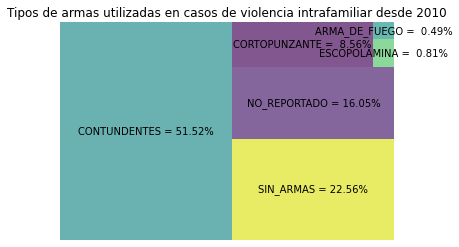

In [262]:
#Gráfico treemap con porcentajes

perc = [f'{i/ARMAS.sum()*100:5.2f}%' for i in ARMAS]
lbl = [f'{el[0]} = {el[1]}' for el in zip(armas2.index, perc)]
squarify.plot(sizes=ARMAS, label=lbl, alpha=.67 )

plt.axis('off')
plt.title('Tipos de armas utilizadas en casos de violencia intrafamiliar desde 2010')
plt.savefig("Tipos de armas.png")
plt.show()


# Historia
En este "mapa de árbol" se quizo visualizar en los casos de violencia intrafamiliar si se presentaron algunos tipos de armas. Se evidencia que la mayoría son con elementos o contundentes que suelen generar una contusión en la persona que recibe el golpe. Es seguido por la violencia sin ningún tipo de armas. Las armas de fuego y las cortopunzantes por ejemplo son armas que pueden ser consideradas letales y muy posiblemente las víctimas no pueden ir a denunciar un ataque de este tipo porque no sobreviven.

In [138]:
datos['GRUPO ETARIO'].value_counts()

ADULTOS         420230
ADOLESCENTES     28396
MENORES          26447
NO REPORTA         274
Name: GRUPO ETARIO, dtype: int64

In [139]:
import nltk 

In [150]:
datosnltk=datos.loc[:,['ARMAS MEDIOS','FECHA HECHO']]
datosnltk=datosnltk.sort_values(by="FECHA HECHO")
datosnltk

,ARMAS MEDIOS,FECHA HECHO
0,CORTOPUNZANTE,2010-01-01
90,CONTUNDENTES,2010-01-01
89,CONTUNDENTES,2010-01-01
88,CONTUNDENTES,2010-01-01
87,CONTUNDENTES,2010-01-01
...,...,...
456777,CONTUNDENTES,2021-05-31
472587,SIN_ARMAS,2021-05-31
457077,CONTUNDENTES,2021-05-31
469126,SIN_ARMAS,2021-05-31


In [151]:
text=datosnltk["ARMAS MEDIOS"].to_string()

In [152]:
text

'0         CORTOPUNZANTE\n90         CONTUNDENTES\n89         CONTUNDENTES\n88         CONTUNDENTES\n87         CONTUNDENTES\n86         CONTUNDENTES\n85         CONTUNDENTES\n84         CONTUNDENTES\n83         CONTUNDENTES\n82         CONTUNDENTES\n81         CONTUNDENTES\n80         CONTUNDENTES\n79         CONTUNDENTES\n78         CONTUNDENTES\n77         CONTUNDENTES\n76         CONTUNDENTES\n75         CONTUNDENTES\n74         CONTUNDENTES\n73         CONTUNDENTES\n72         CONTUNDENTES\n71         CONTUNDENTES\n70         CONTUNDENTES\n69         CONTUNDENTES\n68         CONTUNDENTES\n67         CONTUNDENTES\n66         CONTUNDENTES\n65         CONTUNDENTES\n64         CONTUNDENTES\n91         CONTUNDENTES\n63         CONTUNDENTES\n92         CONTUNDENTES\n94         CONTUNDENTES\n122          NO REPORTA\n121          NO REPORTA\n120          NO REPORTA\n119           SIN_ARMAS\n118           SIN_ARMAS\n117           SIN_ARMAS\n116           SIN_ARMAS\n114       CORTOPUNZANTE\

In [153]:
from nltk.tokenize import WhitespaceTokenizer

In [154]:
tk = WhitespaceTokenizer()

In [155]:
tokens = tk.tokenize(text)
     
print(tokens)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [156]:
text1 = nltk.Text(tokens)

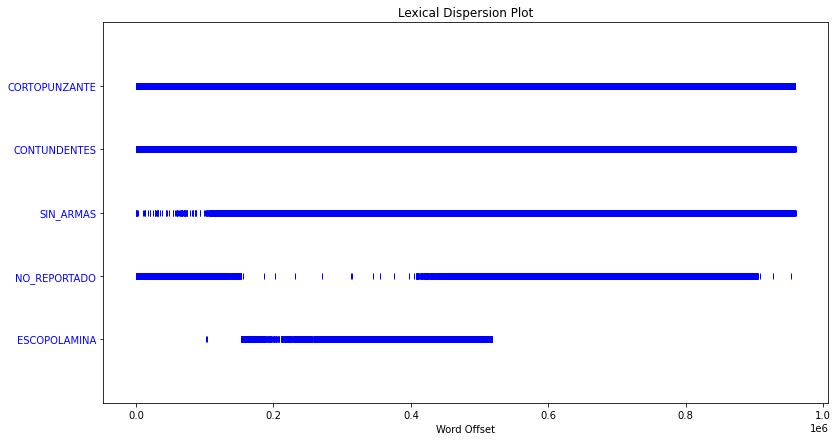

In [265]:

fig = plt.figure(figsize=(13, 7))
fig.savefig("gráfica de dispersión de nltk.png")
text1.dispersion_plot(['CORTOPUNZANTE', 'CONTUNDENTES', 'SIN_ARMAS', 'NO_REPORTADO', 'ESCOPOLAMINA'])


# Historia
Se quizo estudiar si existió algún tipo de tendencia frente al uso de las armas pero como se puede ver las primeras tres categorías: contundentes, cortopunzantes y sin armas fueron relativamente constantes en el tiempo en el periodo que se estudia. Luego se ve el comportamento de no reportado y del uso de escopolamina, en el primero de estos pueden haber distintas razones para ello. Puede ser porque las víctimas no se sintieron cómodas compartiendo esa información o tal vez porque las personas que las atendieron no les preguntaron. En el caso de la escopolamina pues es considerada un arma en este contexto porque la gente se puede aprovechar de la posición de vulnerabilidad en la que está la persona bajo la influencia de la misma.

# Conclusión

Con estos datos se pueden plantear varios caminos de acción en términos de política pública para dar un apoyo más integral a cualquier persona que esté pasando por esta situación en el país. Muy posiblemente no se puede cuantificar la magnitud de esta problemática pero por lo menos se puede tratar de caracterizar y entender más a fondo para brindarle la ayuda que necesitan estas personas.